In [1]:
import pylab as plt
%matplotlib inline

def read_tab_only(inputfile):
    
    f=open(inputfile,'r').read().split('\n')

    time=[]
    pitch=[]
    for i in range(1,len(f)):
        line=f[i]
        if line!="":
            split=line.split('\t')
            #print split
            time.append(float(split[0]))
            pitch.append(float(split[1]))
    
    #plt.plot(pitch,'gx')
    return time,pitch

#'pitch/pitcCHJ000001.tab','procd_pitch_newtrim/CHJ000001_proc.tab'
def plot_one_file(pitch_file,procd_file):
    
    time,pitch=read_tab_only(pitch_file)
    ntime,npitch=read_tab_only(procd_file)
    plt.figure()
    plt.plot(time,pitch,'x')
    plt.plot(ntime,npitch,'ro')
    plt.title(procd_file)

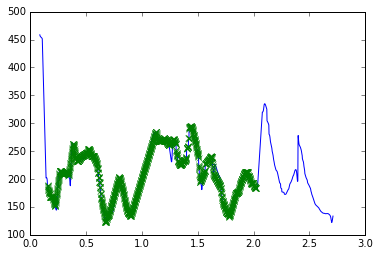

In [2]:
time,pitch=read_tab_only('pitch/pitcXUL001040.tab')
plt.plot(time,pitch)
t,p=read_tab_only('procd_pitch_newtrim_final/XUL001040_proc.tab')
plt.plot(t,p,'x')

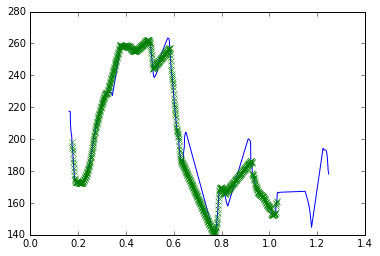

In [19]:
time,pitch=read_tab_only('pitch/pitcCHX000490.tab')
plt.plot(time,pitch)
t,p=read_tab_only('procd_pitch_newtrim_final/CHX000490_proc.tab')
plt.plot(t,p,'x')

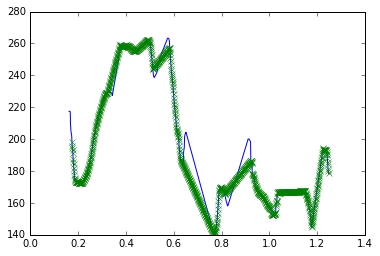

In [20]:
from scipy.interpolate import interp1d
import numpy as np

time,pitch=read_tab_only('pitch/pitcCHX000490.tab')
plt.plot(time,pitch)
t,p=read_tab_only('procd_pitch_newtrim_final/CHX000490_proc.tab')
plt.plot(t,p,'x')


extend_pitch=[pitch[i] for i in range(len(time)) if time[i]>t[-1]]
extend_time=[time[i] for i in range(len(time)) if time[i]>t[-1]]
fp=interp1d(extend_time,extend_pitch)
begin,end=extend_time[0],extend_time[-1]
interp_time=np.arange(float(begin),float(end),0.001)
interp_pitch=fp(interp_time)
t.extend(interp_time[:])
p.extend(interp_pitch[:])
plt.plot(time,pitch)
plt.plot(t,p,'x')

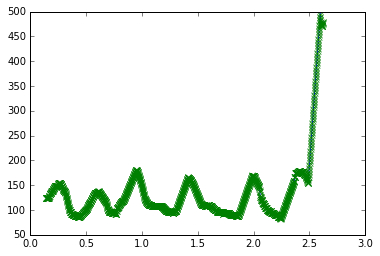

In [28]:

time,pitch=read_tab_only('pitch/pitcCHJ000010.tab')
plt.plot(time,pitch)
t,p=read_tab_only('procd_pitch_newtrim_final/CHJ000010_proc.tab')
plt.plot(t,p,'x')

two problems:

1. the last syllable could be error prone.
2. handle duplicates in file list
3. the first several files are already modified in the procd pitch dir. We need to replace those. Then, we have to make a decision regarding how to treat the final syllable - we don't want to bring back the spurious pitch we trimmed off. Leaving the final syllable off is a ok choice.

In [38]:
#there are 1621 pitch files where syllables at the end are chopped off in the process of procd_pitch. These are cases where we need to restore the pitch values from the original pitch/ files. Use this script to do so.

from scipy.interpolate import interp1d
import numpy as np

def read_tab_only(inputfile):
    
    f=open(inputfile,'r').read().split('\n')

    time=[]
    pitch=[]
    for i in range(1,len(f)):
        line=f[i]
        if line!="":
            split=line.split('\t')
            #print split
            time.append(float(split[0]))
            pitch.append(float(split[1]))
    
    #plt.plot(pitch,'gx')
    return time,pitch


def extend_pitch(pitch_file,procd_file):

    #pitch file:'pitch/pitcCHX000490.tab'
    time,pitch=read_tab_only(pitch_file)

    #plt.plot(time,pitch)

    #procd file:'procd_pitch_newtrim_final/CHX000490_proc.tab'
    t,p=read_tab_only(procd_file)
    #plt.plot(t,p,'x')
    extend_pitch=[pitch[i] for i in range(len(time)) if time[i]>t[-1]]
    extend_time=[time[i] for i in range(len(time)) if time[i]>t[-1]]

    if extended_time==[]:
        return t,p


    fp=interp1d(extend_time,extend_pitch)
    begin,end=extend_time[0],extend_time[-1]
    interp_time=np.arange(float(begin)+0.001,float(end)-0.001,0.001)
    interp_pitch=fp(interp_time)
    t.extend(interp_time[:])
    p.extend(interp_pitch[:])
    #plt.plot(time,pitch)
    #plt.plot(t,p,'x')
    return t,p


def read_file_list(error_file):
    all_lines=open(error_file,'r').read().split('\n')
    file_list=[]
    for line in all_lines:
        len_syl=line.split(' ')[1]
        if len_syl!='0':
            continue
        file_name=line.split('_')[0]
        file_list.append(file_name)
    return file_list



import random

def main():
    error_file = 'lennew.txt'
    file_list=read_file_list(error_file)
    #print file_list
    rand_files=random.sample(file_list,50)
    pitch_path='pitch/'
    procd_path='procd_pitch_newtrim_final/'
    extend_path='extended_procd'
    for file_name in rand_files:
        #print file_name
        pitch_file = pitch_path + 'pitc' + file_name + '.tab'
        procd_file = procd_path + file_name + '_proc.tab'
        out_file = extend_path + file_name + '_proc.tab'
        
        #pitch file:'pitch/pitcCHX000490.tab'
        time,pitch=read_tab_only(pitch_file)
        plt.figure()
        plt.plot(time,pitch,'ro-')
        plt.title(file_name)

        #procd file:'procd_pitch_newtrim_final/CHX000490_proc.tab'
        t,p=read_tab_only(procd_file)
        plt.plot(t,p,'x')
        #new_time,new_pitch = extend_pitch(pitch_file, procd_file)
        #write this to new procd pitch file with the same name
        















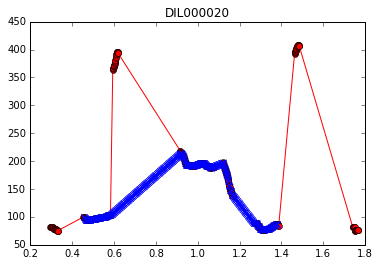

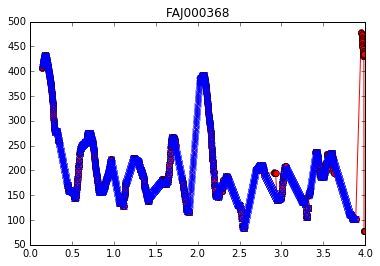

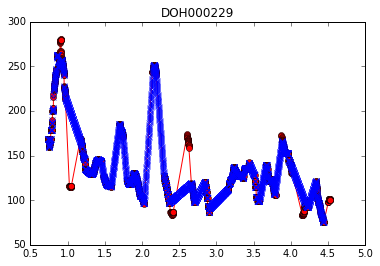

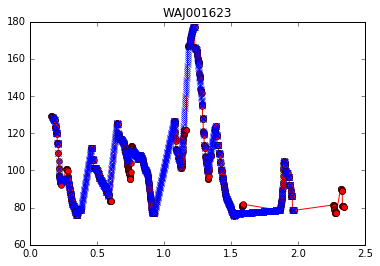

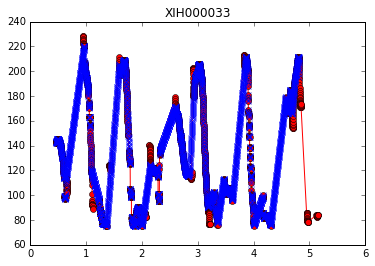

...

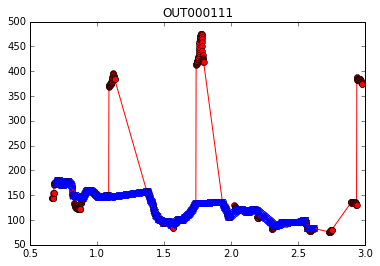

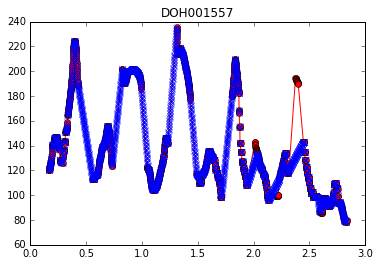

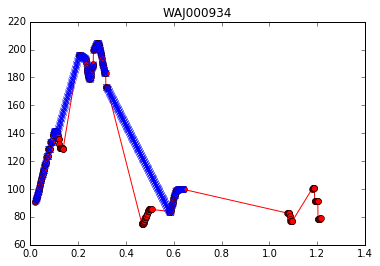

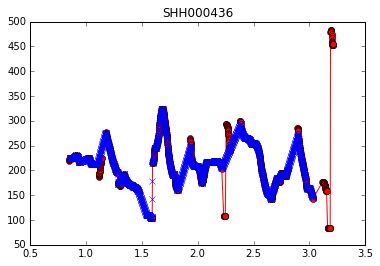

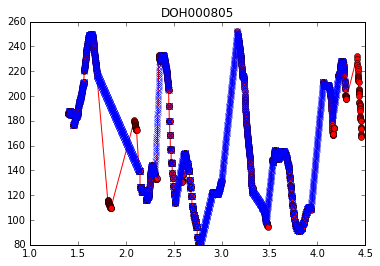

In [39]:
main()

8 out of 50 is harmed by extending the last syllable.

next step:
1. we can do 200 random samples to evaluate. if the result is the same, we do extended pitch. 
2. this 1600 something represents the parts of the pitch profiles where our preprocessing has failed. But it also attests to the large majority number of cases where it succeeded, including cases where spurious pitch values are pruned off which cannot be measured by length of the TS. (but rather in formal evaluation)

3. is there a last resort measure to prevent those 8 cases?


In [ ]:
#what is the speaker distribution?

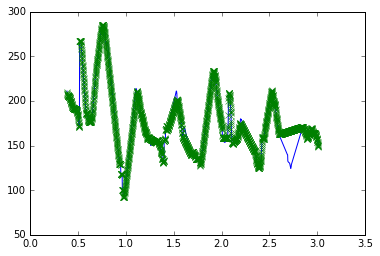

In [26]:
extend_pitch=[pitch[i] for i in range(len(time)) if time[i]>t[-1]]
extend_time=[time[i] for i in range(len(time)) if time[i]>t[-1]]
fp=interp1d(extend_time,extend_pitch)
begin,end=extend_time[0],extend_time[-1]
interp_time=np.arange(float(begin)+0.001,float(end)-0.001,0.001)
interp_pitch=fp(interp_time)
t.extend(interp_time[:])
p.extend(interp_pitch[:])
plt.plot(time,pitch)
plt.plot(t,p,'x')

## version: without unvoiced trimming, T=130 if filter_std < 60 else 200

['FAJ000521_proc.tab', 'XIN000254_proc.tab', 'FAJ000608_proc.tab', 'SUC000450_proc.tab', 'WAJ000136_proc.tab', 'WAJ000249_proc.tab', 'RUO000389_proc.tab', 'XIN000597_proc.tab', 'DOH000269_proc.tab', 'XIH100315_proc.tab', 'SHH000024_proc.tab', 'XIH100437_proc.tab', 'KOF000122_proc.tab', 'DIL000160_proc.tab', 'WAJ000644_proc.tab', 'OUT000159_proc.tab', 'XIJ000268_proc.tab', 'DOH000127_proc.tab', 'KOF000034_proc.tab', 'XUL001023_proc.tab', 'KOF000146_proc.tab', 'DOH000882_proc.tab', 'OUT000109_proc.tab', 'XIY000215_proc.tab', 'CHX000286_proc.tab', 'SHH000497_proc.tab', 'WAJ000390_proc.tab', 'XIH100407_proc.tab', 'WAJ000043_proc.tab', 'CHX000191_proc.tab', 'DIL000393_proc.tab', 'RUO000278_proc.tab', 'CHX000104_proc.tab', 'MAK000144_proc.tab', 'DOH001566_proc.tab', 'TIK000046_proc.tab', 'CHX000078_proc.tab', 'OUT000014_proc.tab', 'WAJ000090_proc.tab', 'SHH000312_proc.tab', 'DOH000586_proc.tab', 'WAJ001455_proc.tab', 'FAJ001299_proc.tab', 'FAJ000479_proc.tab', 'XIJ000257_proc.tab', 'SHH00036

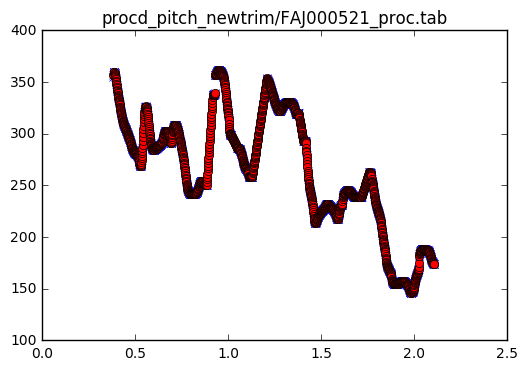

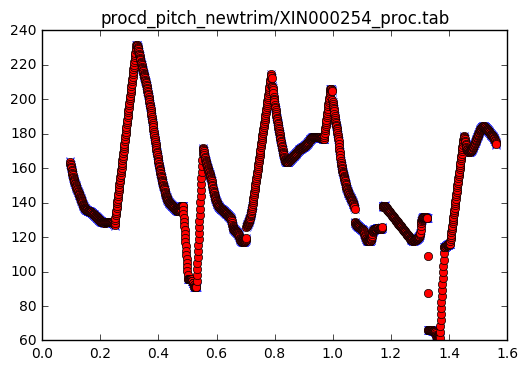

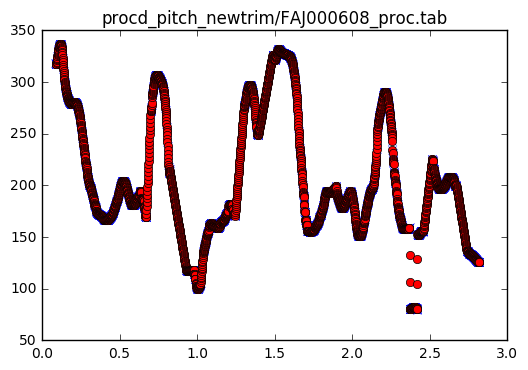

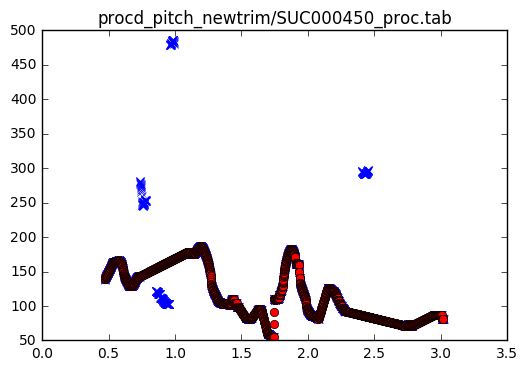

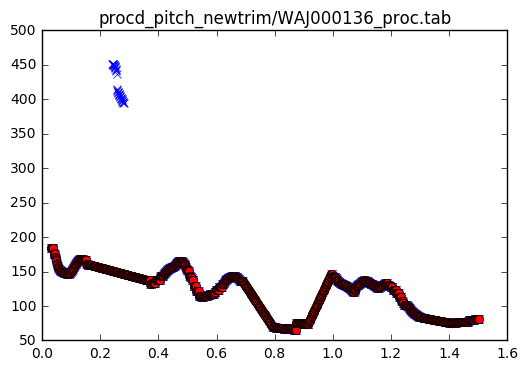

...

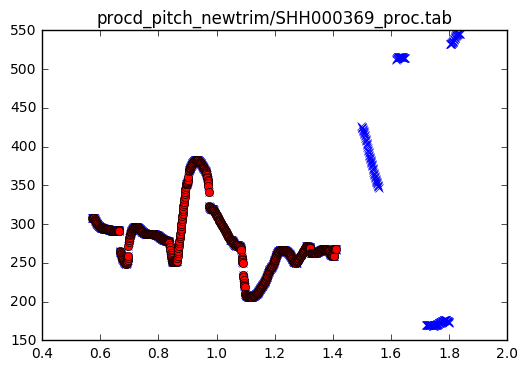

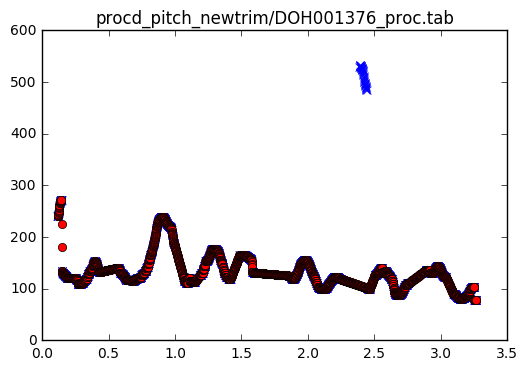

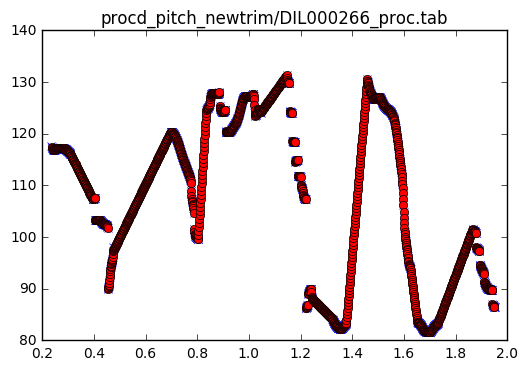

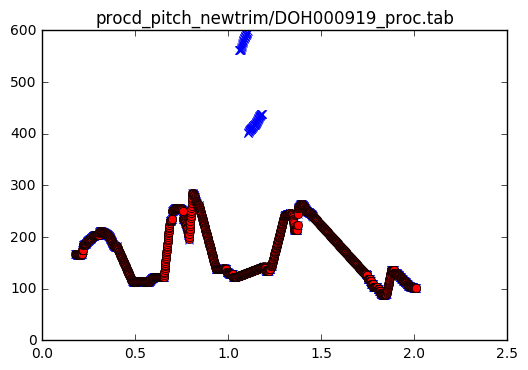

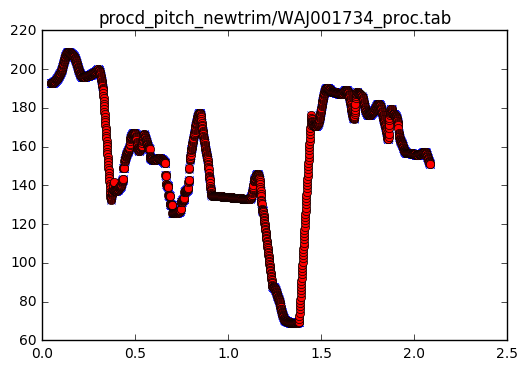

In [5]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'procd_pitch_newtrim'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    pitch_file = pitch_path + "/" + 'pitc' + core_name + '.tab'
    procd_file = procd_path + '/' + file_name
    plot_one_file(pitch_file, procd_file)

## version: with unvoiced trimming, T=130 if filter_std < 60 else 200

['FAJ000521_proc.tab', 'XIN000254_proc.tab', 'FAJ000608_proc.tab', 'SUC000450_proc.tab', 'WAJ000136_proc.tab', 'WAJ000249_proc.tab', 'RUO000389_proc.tab', 'XIN000597_proc.tab', 'DOH000269_proc.tab', 'XIH100315_proc.tab', 'SHH000024_proc.tab', 'XIH100437_proc.tab', 'KOF000122_proc.tab', 'DIL000160_proc.tab', 'WAJ000644_proc.tab', 'OUT000159_proc.tab', 'XIJ000268_proc.tab', 'DOH000127_proc.tab', 'KOF000034_proc.tab', 'XUL001023_proc.tab', 'KOF000146_proc.tab', 'DOH000882_proc.tab', 'OUT000109_proc.tab', 'XIY000215_proc.tab', 'CHX000286_proc.tab', 'SHH000497_proc.tab', 'WAJ000390_proc.tab', 'XIH100407_proc.tab', 'WAJ000043_proc.tab', 'CHX000191_proc.tab', 'DIL000393_proc.tab', 'RUO000278_proc.tab', 'CHX000104_proc.tab', 'MAK000144_proc.tab', 'DOH001566_proc.tab', 'TIK000046_proc.tab', 'CHX000078_proc.tab', 'OUT000014_proc.tab', 'WAJ000090_proc.tab', 'SHH000312_proc.tab', 'DOH000586_proc.tab', 'WAJ001455_proc.tab', 'FAJ001299_proc.tab', 'FAJ000479_proc.tab', 'XIJ000257_proc.tab', 'SHH00036

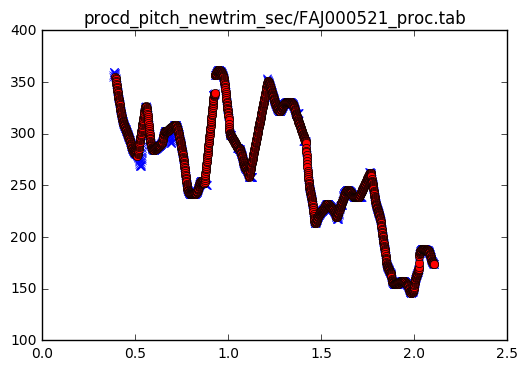

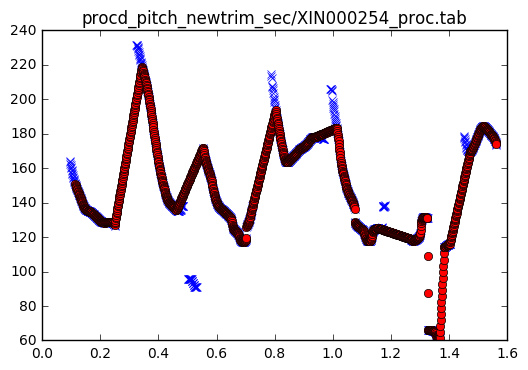

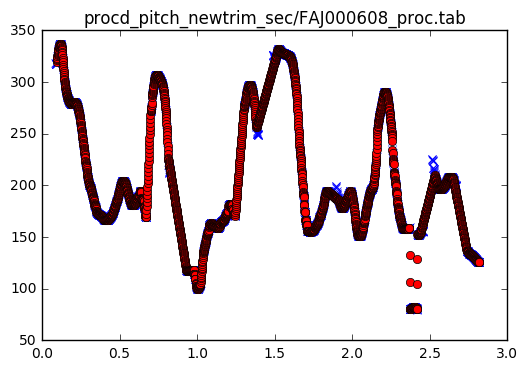

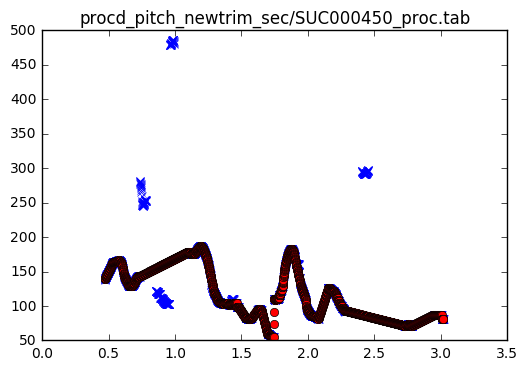

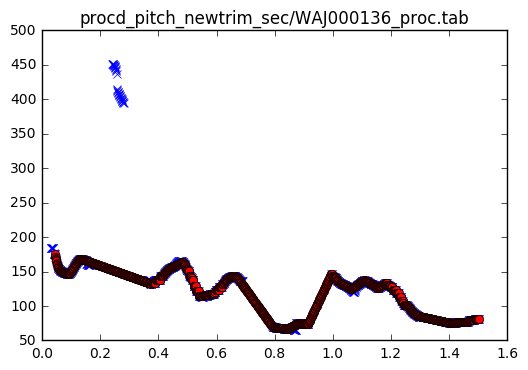

...

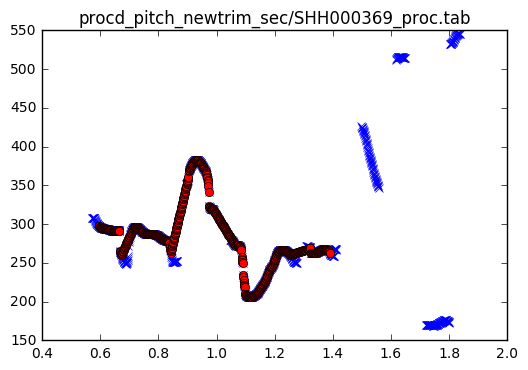

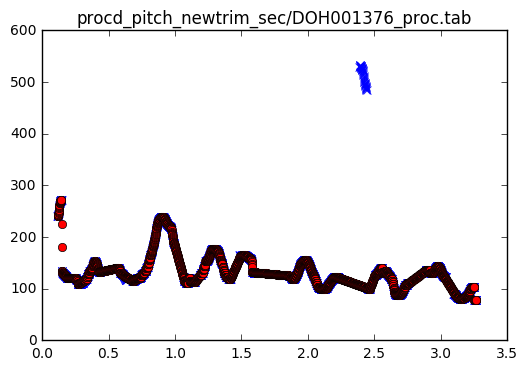

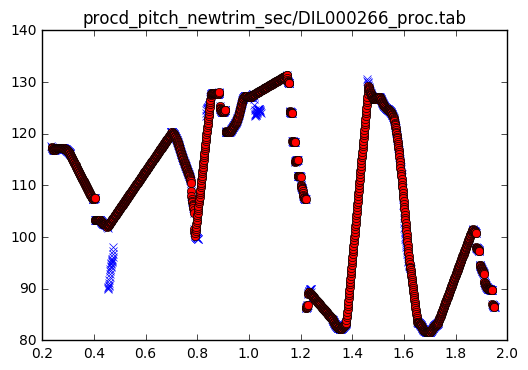

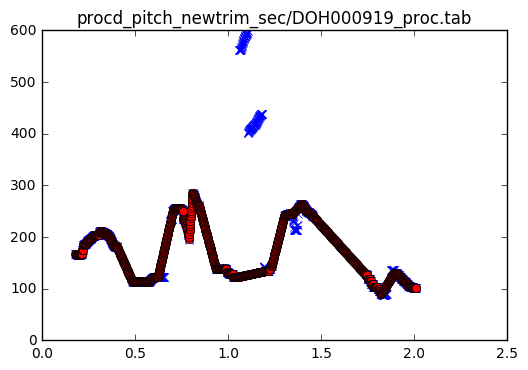

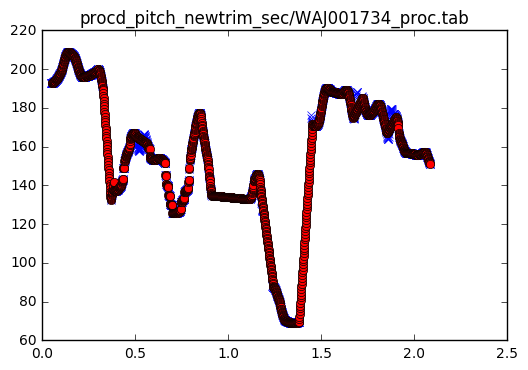

In [6]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'procd_pitch_newtrim_sec'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    pitch_file = pitch_path + "/" + 'pitc' + core_name + '.tab'
    procd_file = procd_path + '/' + file_name
    plot_one_file(pitch_file, procd_file)

## with unvoiced trimming, T=130 if fil_std < 70 else 200

['FAJ000521_proc.tab', 'XIN000254_proc.tab', 'FAJ000608_proc.tab', 'SUC000450_proc.tab', 'WAJ000136_proc.tab', 'WAJ000249_proc.tab', 'RUO000389_proc.tab', 'XIN000597_proc.tab', 'DOH000269_proc.tab', 'XIH100315_proc.tab', 'SHH000024_proc.tab', 'XIH100437_proc.tab', 'KOF000122_proc.tab', 'DIL000160_proc.tab', 'WAJ000644_proc.tab', 'OUT000159_proc.tab', 'XIJ000268_proc.tab', 'DOH000127_proc.tab', 'KOF000034_proc.tab', 'XUL001023_proc.tab', 'KOF000146_proc.tab', 'DOH000882_proc.tab', 'OUT000109_proc.tab', 'XIY000215_proc.tab', 'CHX000286_proc.tab', 'SHH000497_proc.tab', 'WAJ000390_proc.tab', 'XIH100407_proc.tab', 'WAJ000043_proc.tab', 'CHX000191_proc.tab', 'DIL000393_proc.tab', 'RUO000278_proc.tab', 'CHX000104_proc.tab', 'MAK000144_proc.tab', 'DOH001566_proc.tab', 'TIK000046_proc.tab', 'CHX000078_proc.tab', 'OUT000014_proc.tab', 'WAJ000090_proc.tab', 'SHH000312_proc.tab', 'DOH000586_proc.tab', 'WAJ001455_proc.tab', 'FAJ001299_proc.tab', 'FAJ000479_proc.tab', 'XIJ000257_proc.tab', 'SHH00036

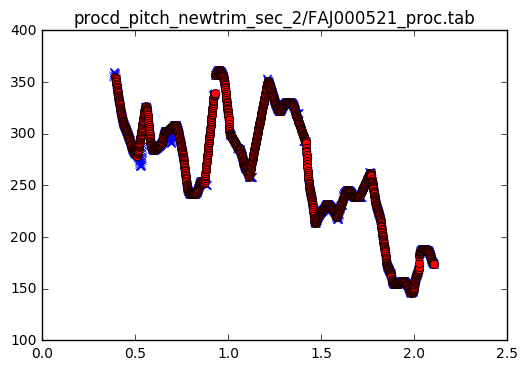

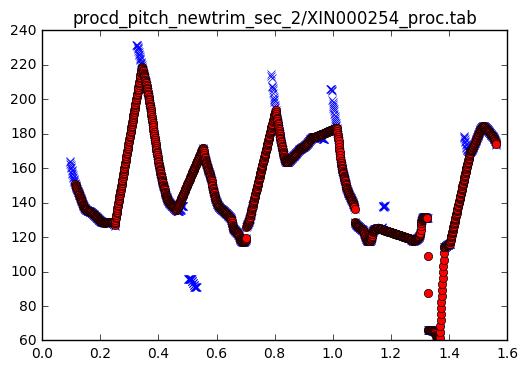

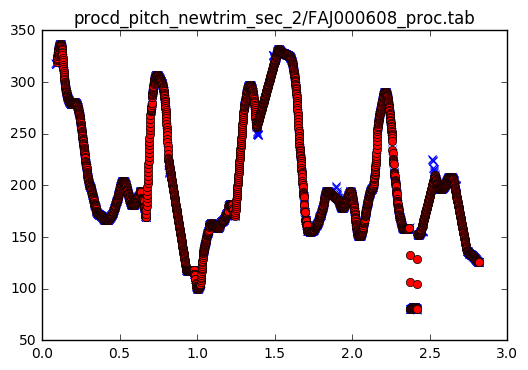

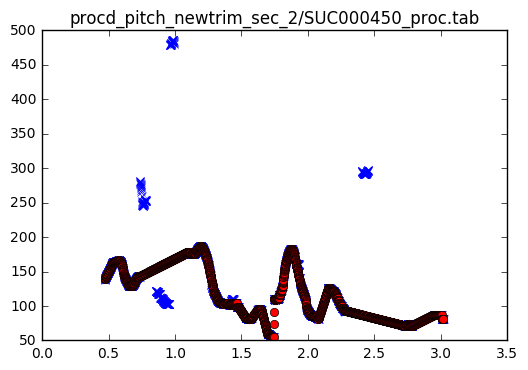

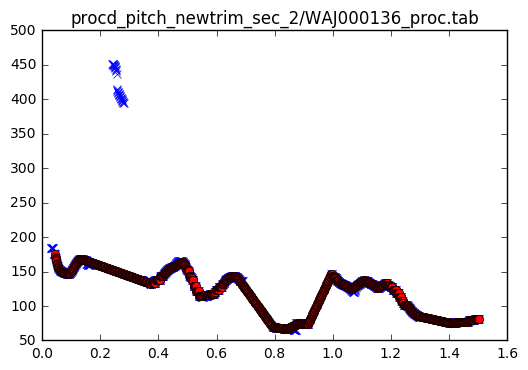

...

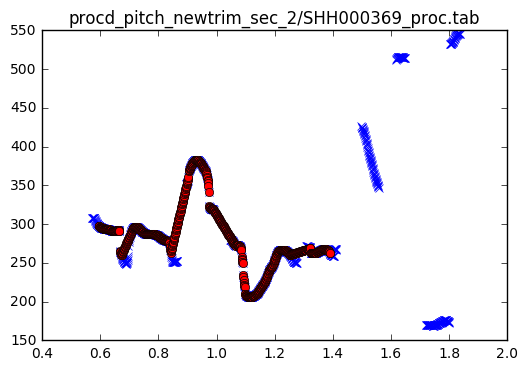

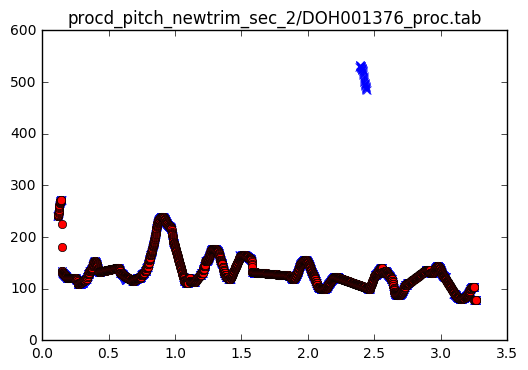

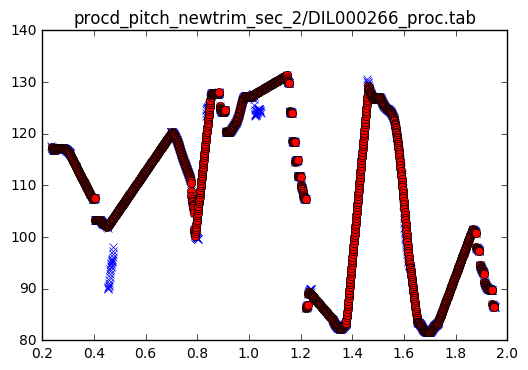

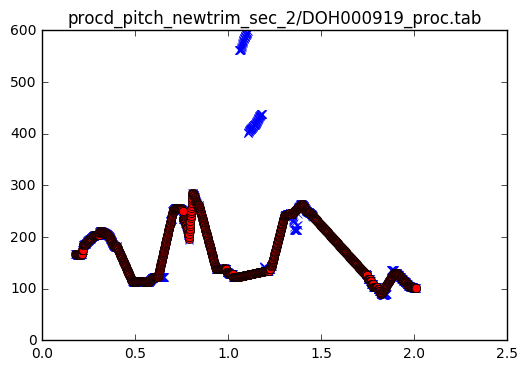

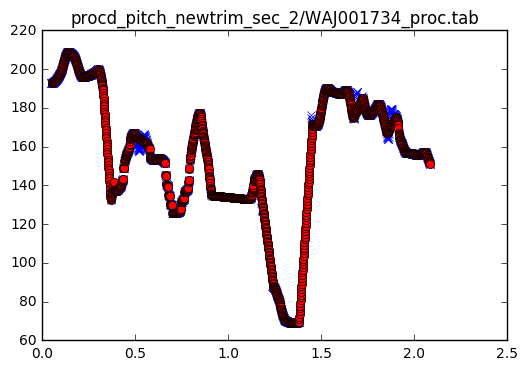

In [7]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'procd_pitch_newtrim_sec_2'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    pitch_file = pitch_path + "/" + 'pitc' + core_name + '.tab'
    procd_file = procd_path + '/' + file_name
    plot_one_file(pitch_file, procd_file)

## same as above except filtered out short segments(len < 50) and shorter segments (len < 100) who also starts with high d1

['FAJ000521_proc.tab', 'XIN000254_proc.tab', 'FAJ000608_proc.tab', 'SUC000450_proc.tab', 'WAJ000136_proc.tab', 'WAJ000249_proc.tab', 'RUO000389_proc.tab', 'XIN000597_proc.tab', 'DOH000269_proc.tab', 'XIH100315_proc.tab', 'SHH000024_proc.tab', 'XIH100437_proc.tab', 'KOF000122_proc.tab', 'DIL000160_proc.tab', 'WAJ000644_proc.tab', 'OUT000159_proc.tab', 'XIJ000268_proc.tab', 'DOH000127_proc.tab', 'KOF000034_proc.tab', 'XUL001023_proc.tab', 'KOF000146_proc.tab', 'DOH000882_proc.tab', 'OUT000109_proc.tab', 'XIY000215_proc.tab', 'CHX000286_proc.tab', 'SHH000497_proc.tab', 'WAJ000390_proc.tab', 'XIH100407_proc.tab', 'WAJ000043_proc.tab', 'CHX000191_proc.tab', 'DIL000393_proc.tab', 'RUO000278_proc.tab', 'CHX000104_proc.tab', 'MAK000144_proc.tab', 'DOH001566_proc.tab', 'TIK000046_proc.tab', 'CHX000078_proc.tab', 'OUT000014_proc.tab', 'WAJ000090_proc.tab', 'SHH000312_proc.tab', 'DOH000586_proc.tab', 'WAJ001455_proc.tab', 'FAJ001299_proc.tab', 'FAJ000479_proc.tab', 'XIJ000257_proc.tab', 'SHH00036

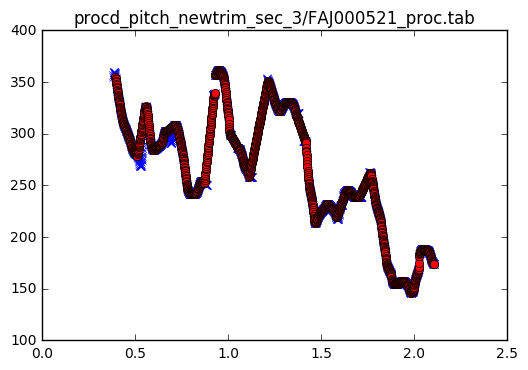

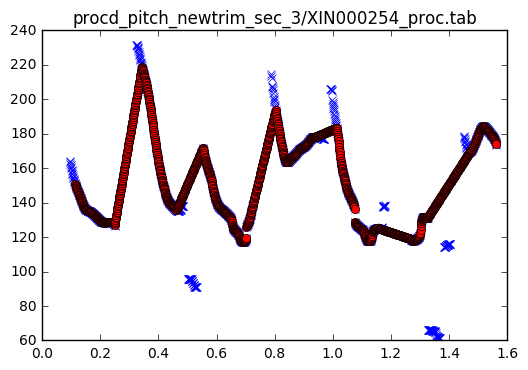

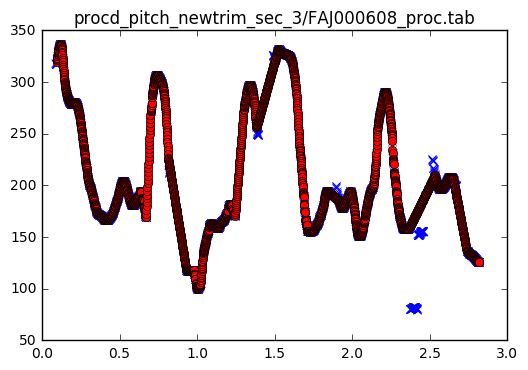

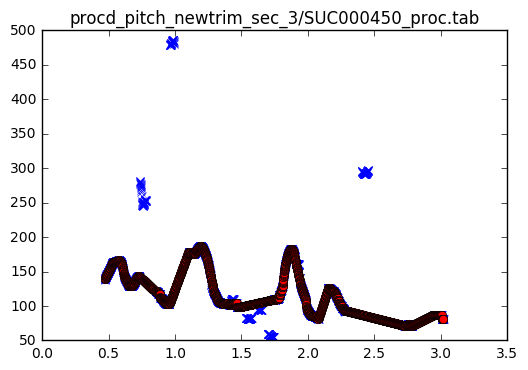

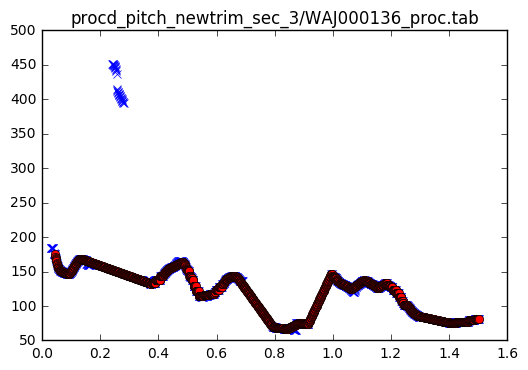

...

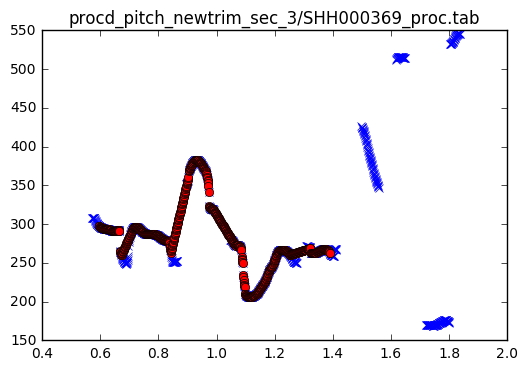

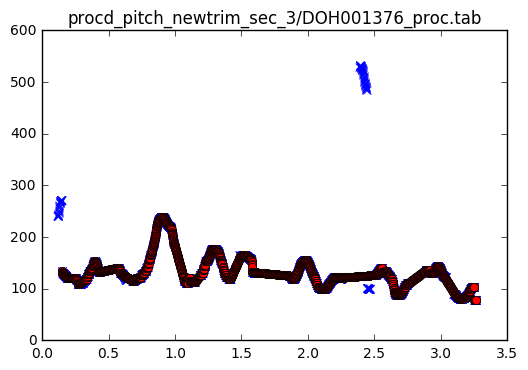

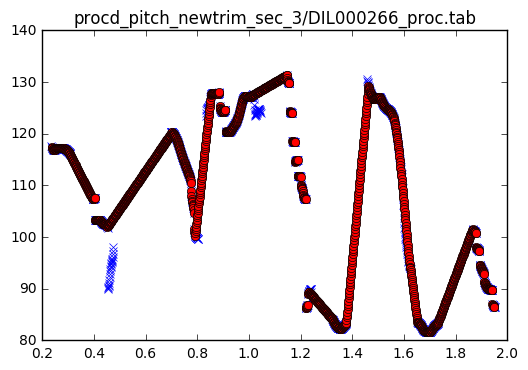

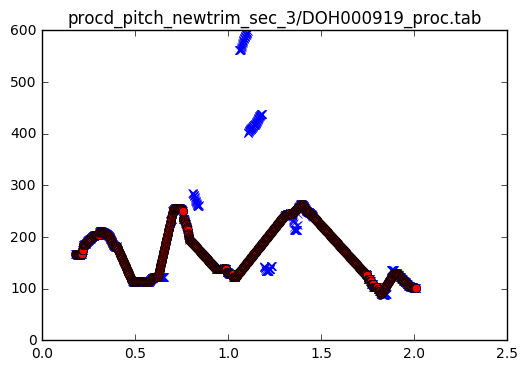

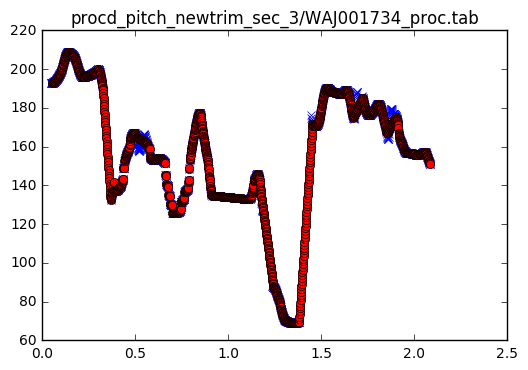

In [9]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'procd_pitch_newtrim_sec_3'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    pitch_file = pitch_path + "/" + 'pitc' + core_name + '.tab'
    procd_file = procd_path + '/' + file_name
    plot_one_file(pitch_file, procd_file)

<hr>

# plotting some individual cases

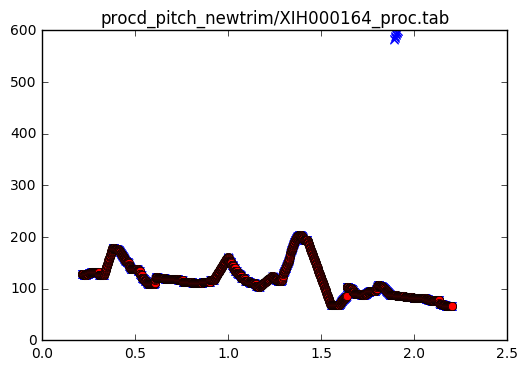

In [16]:
plot_one_file('pitch/pitcXIH000164.tab','procd_pitch_newtrim/XIH000164_proc.tab')

# normalized pitch: evaluate 50 files randomly

this version: 50,600,0.001 pitch processing; temporal filtering (jump, trim) only

In [2]:
#'pitch/pitcCHJ000001.tab','procd_pitch_newtrim/CHJ000001_proc.tab'
def plot_norm_file(norm_file):
    
    
    time,pitch=read_tab_only(norm_file)
    plt.figure()
    plt.plot(time,pitch,'ro')
    plt.title(norm_file)

['FAJ000521_norm.tab', 'XIN000254_norm.tab', 'FAJ000608_norm.tab', 'SUC000450_norm.tab', 'WAJ000136_norm.tab', 'WAJ000249_norm.tab', 'RUO000389_norm.tab', 'XIN000597_norm.tab', 'DOH000269_norm.tab', 'XIH100315_norm.tab', 'SHH000024_norm.tab', 'XIH100437_norm.tab', 'KOF000122_norm.tab', 'DIL000160_norm.tab', 'WAJ000644_norm.tab', 'OUT000159_norm.tab', 'XIJ000268_norm.tab', 'DOH000127_norm.tab', 'KOF000034_norm.tab', 'XUL001023_norm.tab', 'KOF000146_norm.tab', 'DOH000882_norm.tab', 'OUT000109_norm.tab', 'XIY000215_norm.tab', 'CHX000286_norm.tab', 'SHH000497_norm.tab', 'WAJ000390_norm.tab', 'XIH100407_norm.tab', 'WAJ000043_norm.tab', 'CHX000191_norm.tab', 'DIL000393_norm.tab', 'RUO000278_norm.tab', 'CHX000104_norm.tab', 'MAK000144_norm.tab', 'DOH001566_norm.tab', 'TIK000046_norm.tab', 'CHX000078_norm.tab', 'OUT000014_norm.tab', 'WAJ000090_norm.tab', 'SHH000312_norm.tab', 'DOH000586_norm.tab', 'WAJ001455_norm.tab', 'FAJ001299_norm.tab', 'FAJ000479_norm.tab', 'XIJ000257_norm.tab', 'SHH00036

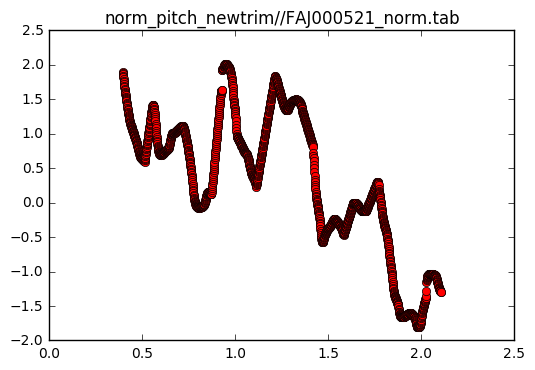

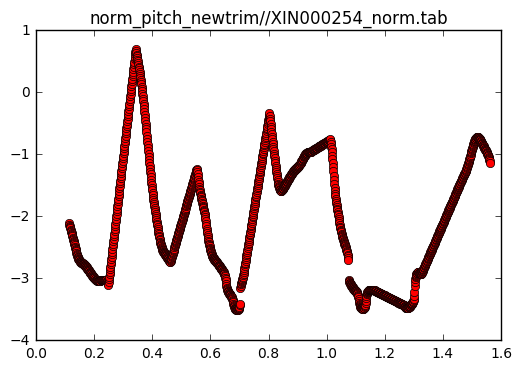

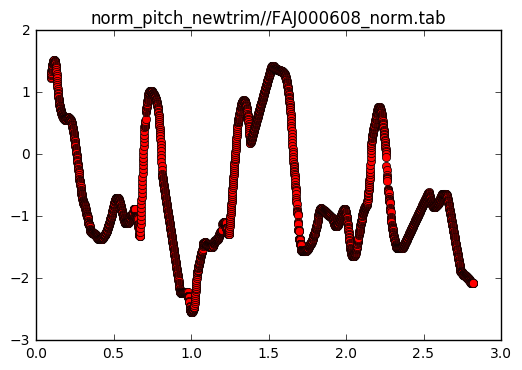

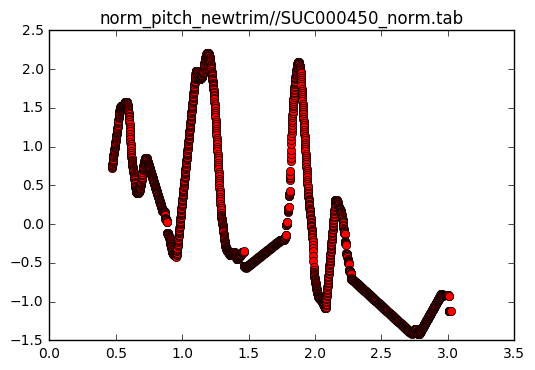

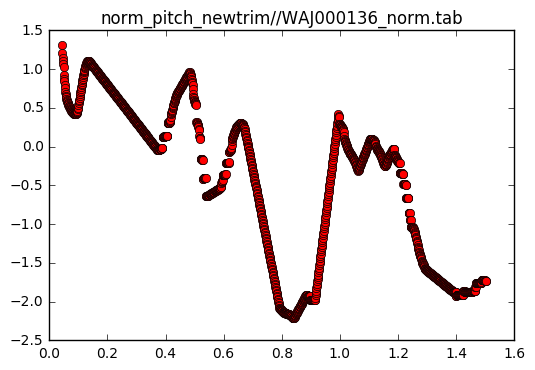

...

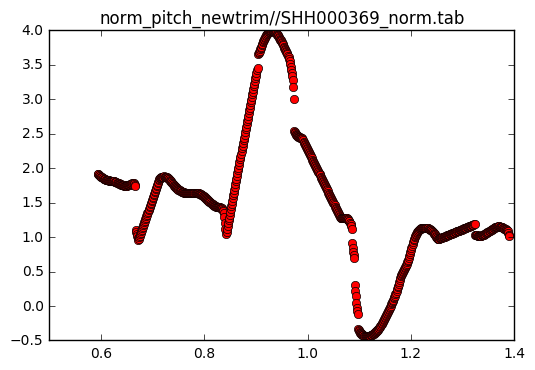

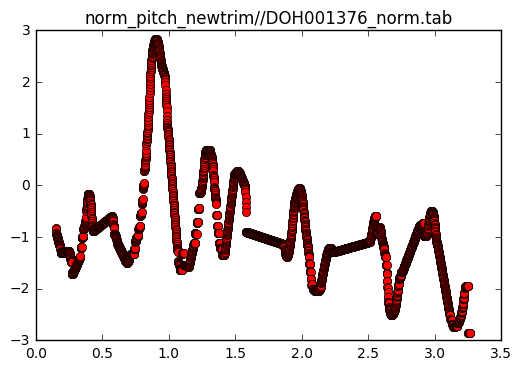

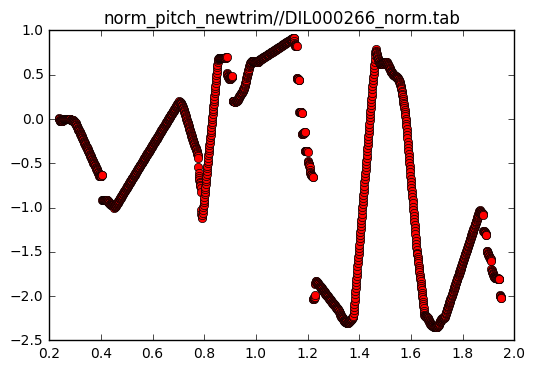

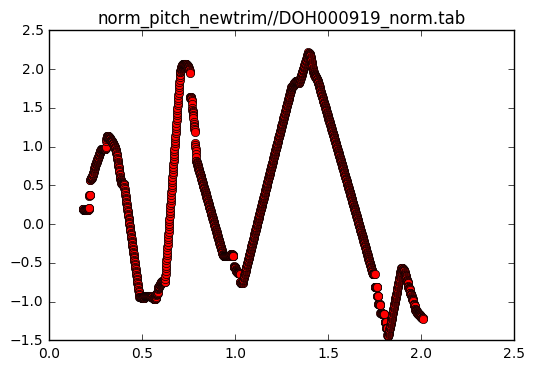

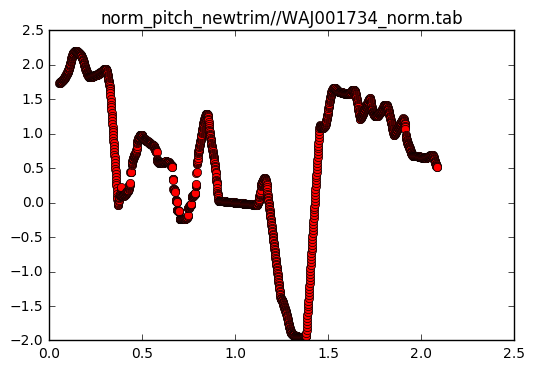

In [13]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'norm_pitch_newtrim'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    procd_file = procd_path + '/' + file_name
    plot_norm_file(procd_file)

# final version: procd pitch vs. pitch

['FAJ000521_proc.tab', 'XIN000254_proc.tab', 'FAJ000608_proc.tab', 'SUC000450_proc.tab', 'WAJ000136_proc.tab', 'WAJ000249_proc.tab', 'RUO000389_proc.tab', 'XIN000597_proc.tab', 'DOH000269_proc.tab', 'XIH100315_proc.tab', 'SHH000024_proc.tab', 'XIH100437_proc.tab', 'KOF000122_proc.tab', 'DIL000160_proc.tab', 'WAJ000644_proc.tab', 'OUT000159_proc.tab', 'XIJ000268_proc.tab', 'DOH000127_proc.tab', 'KOF000034_proc.tab', 'XUL001023_proc.tab', 'KOF000146_proc.tab', 'DOH000882_proc.tab', 'OUT000109_proc.tab', 'XIY000215_proc.tab', 'CHX000286_proc.tab', 'SHH000497_proc.tab', 'WAJ000390_proc.tab', 'XIH100407_proc.tab', 'WAJ000043_proc.tab', 'CHX000191_proc.tab', 'DIL000393_proc.tab', 'RUO000278_proc.tab', 'CHX000104_proc.tab', 'MAK000144_proc.tab', 'DOH001566_proc.tab', 'TIK000046_proc.tab', 'CHX000078_proc.tab', 'OUT000014_proc.tab', 'WAJ000090_proc.tab', 'SHH000312_proc.tab', 'DOH000586_proc.tab', 'WAJ001455_proc.tab', 'FAJ001299_proc.tab', 'FAJ000479_proc.tab', 'XIJ000257_proc.tab', 'SHH00036

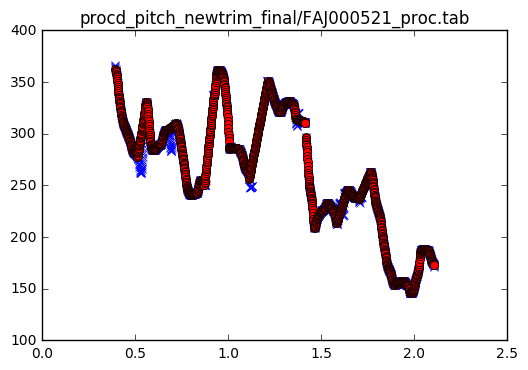

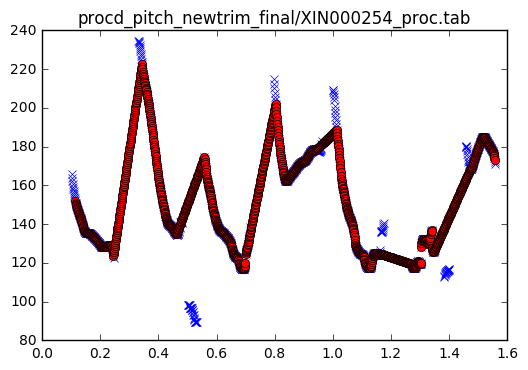

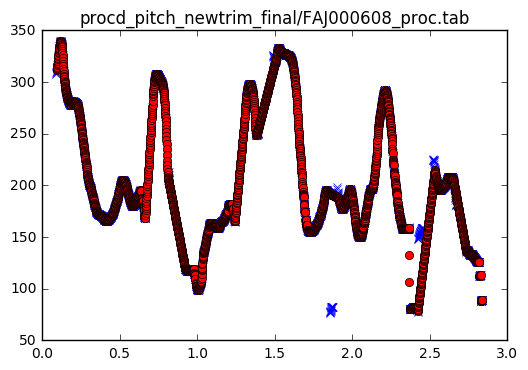

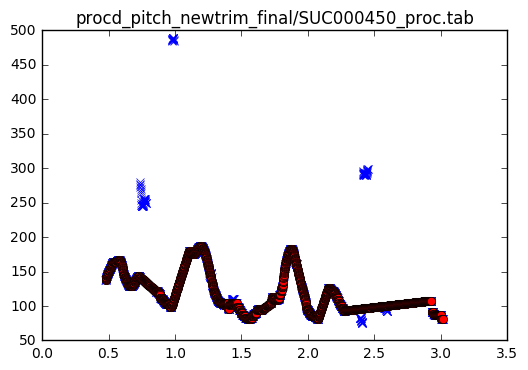

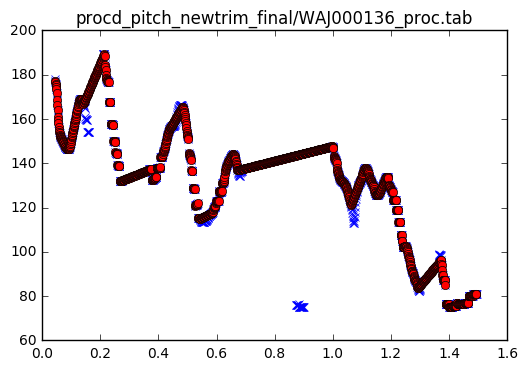

...

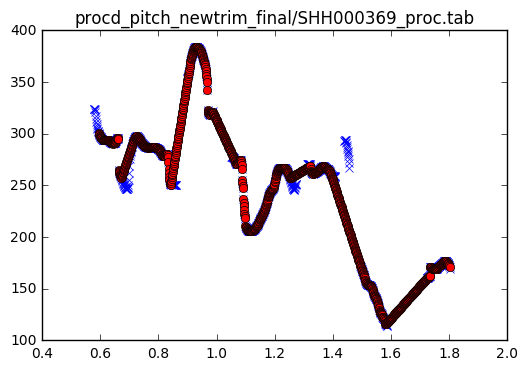

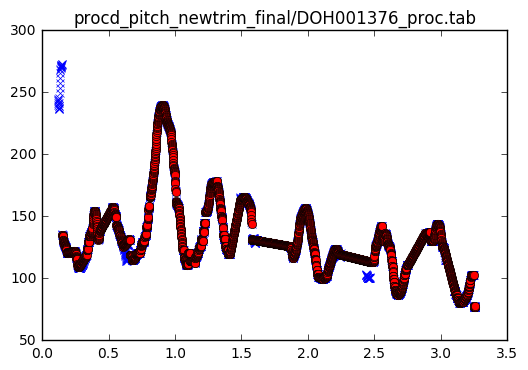

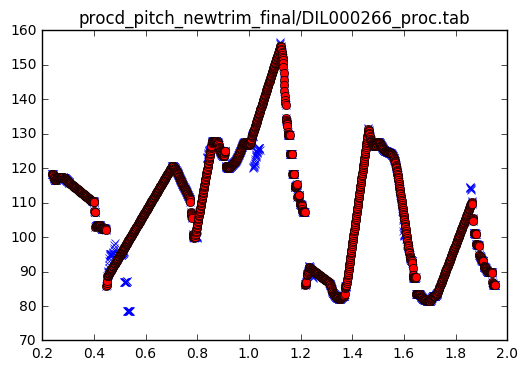

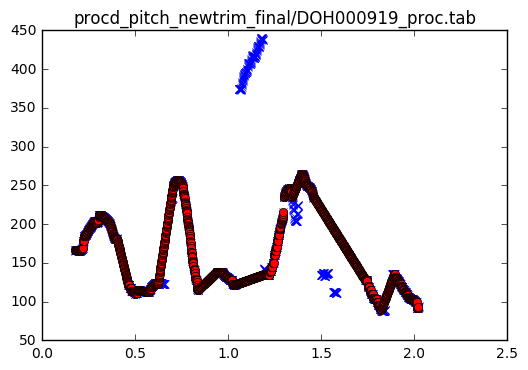

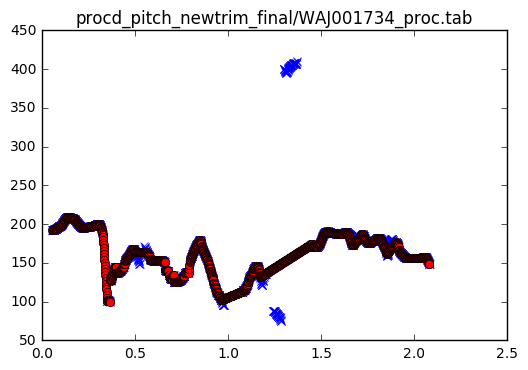

In [7]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'procd_pitch_newtrim_final'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    pitch_file = pitch_path + "/" + 'pitc' + core_name + '.tab'
    procd_file = procd_path + '/' + file_name
    plot_one_file(pitch_file, procd_file)

# final version evaluation: normalized pitch (bark scale subtract mean)

['FAJ000521_norm.tab', 'XIN000254_norm.tab', 'FAJ000608_norm.tab', 'SUC000450_norm.tab', 'WAJ000136_norm.tab', 'WAJ000249_norm.tab', 'RUO000389_norm.tab', 'XIN000597_norm.tab', 'DOH000269_norm.tab', 'XIH100315_norm.tab', 'SHH000024_norm.tab', 'XIH100437_norm.tab', 'KOF000122_norm.tab', 'DIL000160_norm.tab', 'WAJ000644_norm.tab', 'OUT000159_norm.tab', 'XIJ000268_norm.tab', 'DOH000127_norm.tab', 'KOF000034_norm.tab', 'XUL001023_norm.tab', 'KOF000146_norm.tab', 'DOH000882_norm.tab', 'OUT000109_norm.tab', 'XIY000215_norm.tab', 'CHX000286_norm.tab', 'SHH000497_norm.tab', 'WAJ000390_norm.tab', 'XIH100407_norm.tab', 'WAJ000043_norm.tab', 'CHX000191_norm.tab', 'DIL000393_norm.tab', 'RUO000278_norm.tab', 'CHX000104_norm.tab', 'MAK000144_norm.tab', 'DOH001566_norm.tab', 'TIK000046_norm.tab', 'CHX000078_norm.tab', 'OUT000014_norm.tab', 'WAJ000090_norm.tab', 'SHH000312_norm.tab', 'DOH000586_norm.tab', 'WAJ001455_norm.tab', 'FAJ001299_norm.tab', 'FAJ000479_norm.tab', 'XIJ000257_norm.tab', 'SHH00036

/Users/zangsir/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


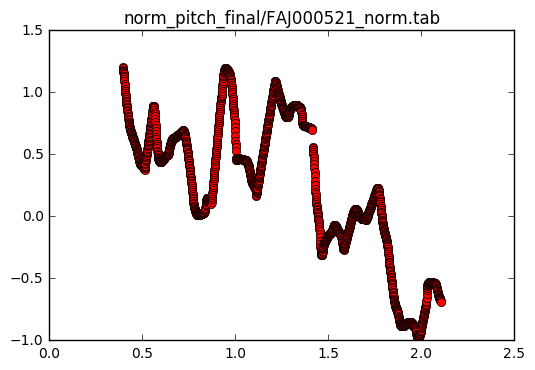

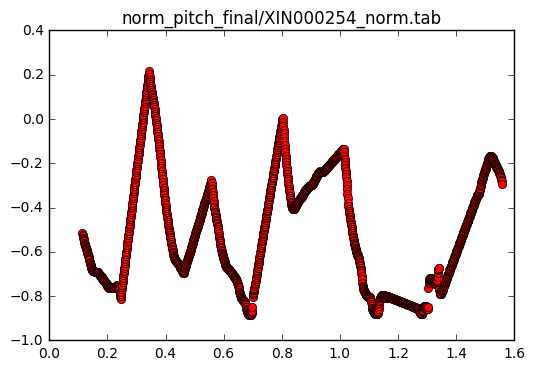

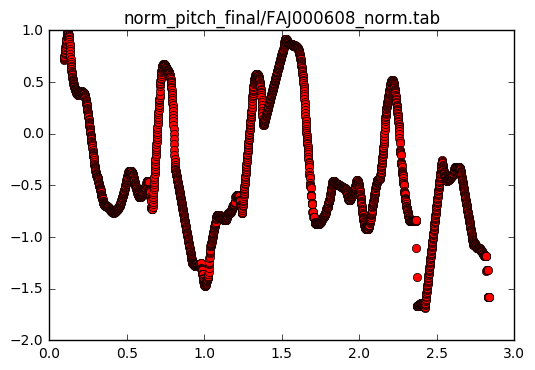

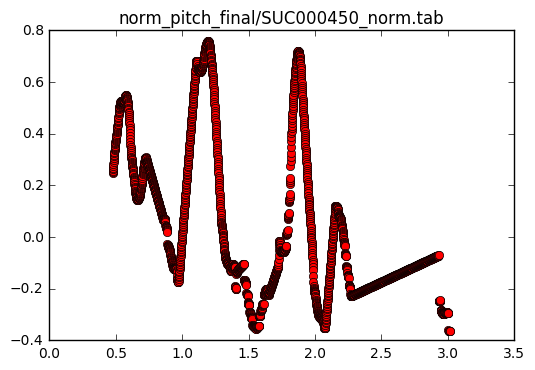

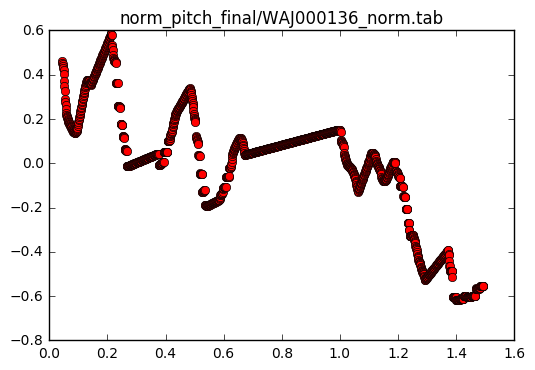

...

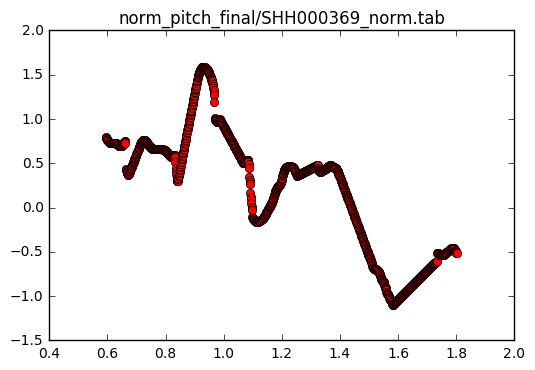

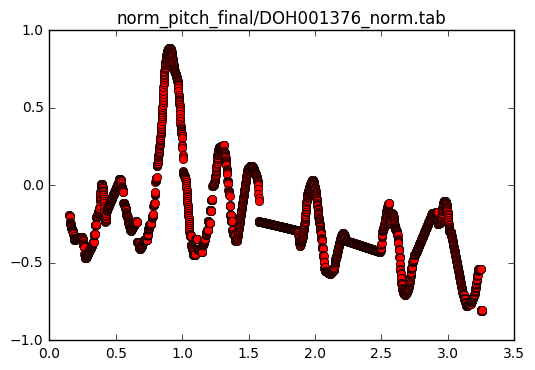

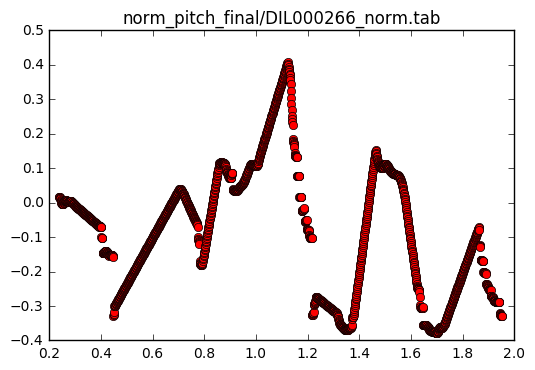

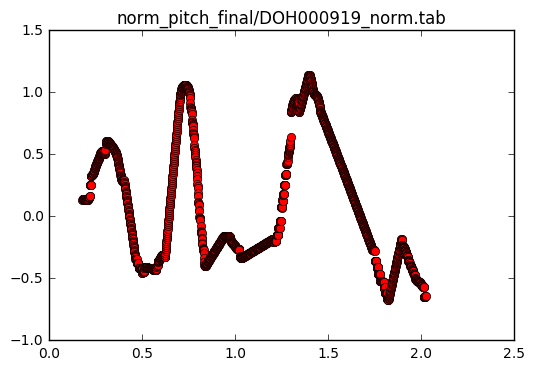

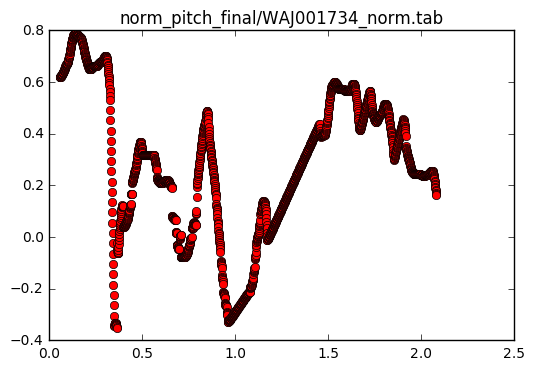

In [3]:
import random
from os import listdir
pitch_path = 'pitch'
procd_path = 'norm_pitch_final'
onlyfiles = [ f for f in listdir(procd_path) if f.endswith(".tab")]
#print onlyfiles
SEED=249
random.seed(SEED)
sampled_files=random.sample(onlyfiles,50)
print sampled_files
for file_name in sampled_files:
    core_name = file_name.split('_')[0]
    procd_file = procd_path + '/' + file_name
    plot_norm_file(procd_file)